In [1]:
# ============================================================
# CELL 1 — Install
# ============================================================
import os
os.environ["PYTORCH_ALLOC_CONF"] = "expandable_segments:True"

!git clone https://github.com/facebookresearch/sam2.git
%cd sam2
!pip install -e . -q
!pip install -e ".[dev]" -q
!pip install pycocotools -q
print("Done.")

Cloning into 'sam2'...
remote: Enumerating objects: 1096, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 1096 (delta 1), reused 0 (delta 0), pack-reused 1094 (from 2)
Receiving objects: 100% (1096/1096), 134.84 MiB | 38.00 MiB/s, done.
Resolving deltas: 100% (376/376), done.
/kaggle/working/sam2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 6.2 MB/s eta 0:00:00
  Building editable for SAM-2 (pyproject.toml) ... done
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable m

In [8]:
# ============================================================
# CELL 2 — Download checkpoint
# ============================================================
import os
os.makedirs("checkpoints", exist_ok=True)
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_tiny.pt \
      -O checkpoints/sam2.1_hiera_tiny.pt
print("Checkpoint ready.")

Checkpoint ready.


In [9]:
# ============================================================
# CELL 3 — Imports & constants
# ============================================================
import os, json, random, gc, math, cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
from tqdm import tqdm
from pycocotools import mask as mask_util
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

DEVICE     = "cuda" if torch.cuda.is_available() else "cpu"
BASE_PATH  = "/kaggle/input/datasets/karimtawfik/hieroglyphics-segmentation-data-sam-2-format/segmentation.v1-2023-03-12-7-33pm.sam2"
TRAIN_DIR  = BASE_PATH + "/train"
VALID_DIR  = BASE_PATH + "/valid"
TEST_DIR   = BASE_PATH + "/test"

EPOCHS     = 12
PATIENCE   = 5
LR         = 1e-4
MAX_SIZE   = 512   # longest side — halves encoder memory vs 1024
BOX_CHUNK  = 120     # boxes per forward pass — tune down if OOM, up if memory free

torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32       = True
print(f"Device: {DEVICE}")

Device: cuda


In [10]:
# ============================================================
# CELL 4 — Image preprocessing (CLAHE + resize)
# ============================================================
def preprocess_image(image_path: str):
    img = cv2.imread(image_path)
    if img is None:
        return None, None
    raw_pil = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    # CLAHE contrast enhancement
    img = cv2.GaussianBlur(img, (3, 3), 0)
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe.apply(l)
    proc = cv2.cvtColor(cv2.merge((l, a, b)), cv2.COLOR_LAB2RGB)

    # resize longest side to MAX_SIZE
    h, w  = proc.shape[:2]
    scale = MAX_SIZE / max(h, w)
    proc  = cv2.resize(proc, (int(w * scale), int(h * scale)),
                       interpolation=cv2.INTER_LINEAR)
    return raw_pil, Image.fromarray(proc)


def bbox_from_mask(mask: np.ndarray):
    rows = np.any(mask, axis=1)
    cols = np.any(mask, axis=0)
    if not rows.any():
        return None
    y1, y2 = np.where(rows)[0][[0, -1]]
    x1, x2 = np.where(cols)[0][[0, -1]]
    return [int(x1), int(y1), int(x2), int(y2)]

In [11]:
# ============================================================
# CELL 5 — Dataset loader
# ============================================================
def load_dataset(data_dir: str):
    json_paths = sorted(glob(os.path.join(data_dir, "*.json")))
    samples, skipped = [], 0
    for jp in json_paths:
        img_path = jp.replace(".json", ".jpg")
        if not os.path.exists(img_path):
            skipped += 1
            continue
        try:
            with open(jp) as f:
                data = json.load(f)
            if not data.get("annotations"):
                skipped += 1
                continue
            samples.append({"image_path": img_path, "json_path": jp})
        except Exception:
            skipped += 1
    print(f"Loaded {len(samples)} samples from {data_dir}  (skipped {skipped})")
    return samples


def read_sample(sample: dict):
    """
    Returns:
        image_np  : HxWx3 uint8 RGB
        bboxes    : list of [x1,y1,x2,y2] scaled to image_np size
        masks     : list of HxW binary uint8 arrays
    Returns (None,None,None) on failure.
    """
    _, proc_pil = preprocess_image(sample["image_path"])
    if proc_pil is None:
        return None, None, None
    image_np = np.array(proc_pil)
    img_h, img_w = image_np.shape[:2]

    try:
        with open(sample["json_path"]) as f:
            data = json.load(f)

        orig_w  = data.get("image", {}).get("width",  img_w)
        orig_h  = data.get("image", {}).get("height", img_h)
        scale_x = img_w / orig_w
        scale_y = img_h / orig_h

        bboxes, masks = [], []
        for ann in data.get("annotations", []):
            segm = ann.get("segmentation", {})
            if not segm.get("counts"):
                continue
            if isinstance(segm["counts"], str):
                segm["counts"] = segm["counts"].encode("utf-8")

            mask = mask_util.decode(segm)
            if mask.sum() == 0:
                continue

            # scale bbox
            if "bbox" in ann and ann["bbox"][2] > 0 and ann["bbox"][3] > 0:
                x, y, w, h = ann["bbox"]
                x1, y1 = x * scale_x, y * scale_y
                x2, y2 = (x + w) * scale_x, (y + h) * scale_y
            else:
                fb = bbox_from_mask(mask)
                if fb is None:
                    continue
                x1, y1, x2, y2 = (fb[0]*scale_x, fb[1]*scale_y,
                                   fb[2]*scale_x, fb[3]*scale_y)

            # resize mask to match processed image
            if mask.shape != (img_h, img_w):
                m = Image.fromarray((mask * 255).astype(np.uint8))
                m = m.resize((img_w, img_h), Image.NEAREST)
                mask = (np.array(m) > 127).astype(np.uint8)

            bboxes.append([float(x1), float(y1), float(x2), float(y2)])
            masks.append(mask)

        if not bboxes:
            return None, None, None
        return image_np, bboxes, masks

    except Exception as e:
        return None, None, None

In [12]:
def augment_sample(image_np, bboxes, masks):
    pil = Image.fromarray(image_np)
    w, h = pil.size

    # existing flips
    if random.random() > 0.5:
        pil    = TF.hflip(pil)
        masks  = [np.fliplr(m) for m in masks]
        bboxes = [[w-x2, y1, w-x1, y2] for x1,y1,x2,y2 in bboxes]

    if random.random() > 0.5:
        pil    = TF.vflip(pil)
        masks  = [np.flipud(m) for m in masks]
        bboxes = [[x1, h-y2, x2, h-y1] for x1,y1,x2,y2 in bboxes]

    # NEW: random rotation ±15 degrees
    if random.random() > 0.5:
        angle = random.uniform(-15, 15)
        pil   = TF.rotate(pil, angle, expand=False)
        # rotate masks the same way
        masks = [
            np.array(TF.rotate(Image.fromarray(m.astype(np.uint8)*255), angle, expand=False)) > 127
            for m in masks
        ]
        # approximate bbox from rotated mask
        new_boxes = []
        for m in masks:
            fb = bbox_from_mask(m.astype(np.uint8))
            new_boxes.append([float(v) for v in fb] if fb else [0,0,1,1])
        bboxes = new_boxes

    # NEW: random scale (zoom in/out)
    if random.random() > 0.5:
        scale = random.uniform(0.8, 1.2)
        new_w, new_h = int(w * scale), int(h * scale)
        pil   = pil.resize((new_w, new_h), Image.BILINEAR)
        pil   = pil.crop((0, 0, w, h)) if scale > 1 else TF.pad(pil, [0,0,w-new_w,h-new_h])
        masks = [
            np.array(Image.fromarray((m*255).astype(np.uint8)).resize(
                (new_w, new_h), Image.NEAREST).crop((0,0,w,h)) if scale > 1
                else np.pad(np.array(Image.fromarray((m*255).astype(np.uint8)).resize(
                (new_w,new_h),Image.NEAREST)),
                ((0,h-new_h),(0,w-new_w)),mode='constant')) > 127
            for m in masks
        ]
        bboxes = [[x*scale, y*scale, min(x2*scale,w), min(y2*scale,h)]
                  for x1,y1,x2,y2 in bboxes
                  for x,y in [(x1,y1)]]   # recompute from masks below

    if random.random() > 0.5:
        pil = TF.adjust_brightness(pil, 0.7 + random.random() * 0.6)
    if random.random() > 0.5:
        pil = TF.adjust_contrast(pil, 0.7 + random.random() * 0.6)
    # NEW: random sharpness
    if random.random() > 0.5:
        pil = TF.adjust_sharpness(pil, random.uniform(0.5, 2.0))
    # NEW: random grayscale (helps since papyrus is low-colour)
    if random.random() > 0.3:
        pil = TF.rgb_to_grayscale(pil, num_output_channels=3)

    # recompute bboxes cleanly from masks
    new_boxes = []
    for m in masks:
        fb = bbox_from_mask(m.astype(np.uint8))
        new_boxes.append([float(v) for v in fb] if fb else bboxes[0])

    return np.array(pil), new_boxes, masks

Loaded 102 samples from /kaggle/input/datasets/karimtawfik/hieroglyphics-segmentation-data-sam-2-format/segmentation.v1-2023-03-12-7-33pm.sam2/train  (skipped 0)


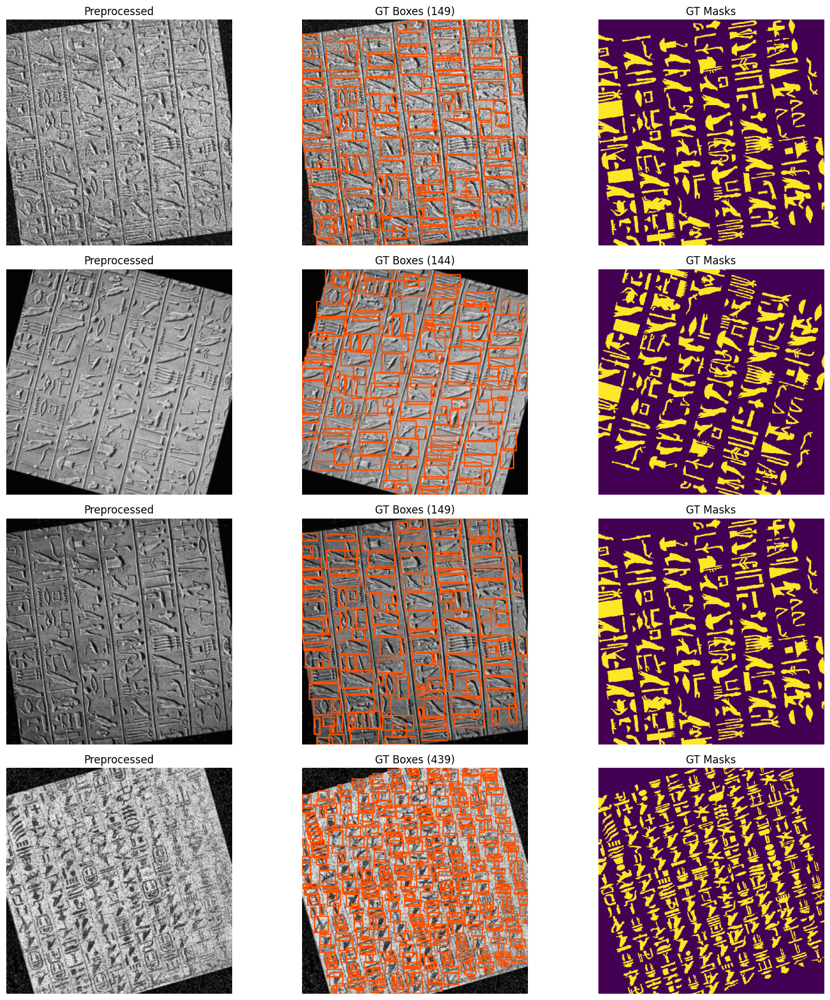

In [13]:
# ============================================================
# CELL 7 — Sanity-check visualisation
# ============================================================
def visualise_samples(data_dir, n=4):
    samples = load_dataset(data_dir)[:n]
    fig, axes = plt.subplots(n, 3, figsize=(15, 4*n))
    if n == 1: axes = [axes]
    for row, s in enumerate(samples):
        image_np, bboxes, masks = read_sample(s)
        if image_np is None: continue
        overlay = image_np.copy()
        for b in bboxes:
            x1,y1,x2,y2 = [int(v) for v in b]
            cv2.rectangle(overlay, (x1,y1), (x2,y2), (255,80,0), 2)
        combined = np.stack(masks).max(axis=0)
        axes[row][0].imshow(image_np);        axes[row][0].set_title("Preprocessed");           axes[row][0].axis("off")
        axes[row][1].imshow(overlay);          axes[row][1].set_title(f"GT Boxes ({len(bboxes)})"); axes[row][1].axis("off")
        axes[row][2].imshow(combined,cmap="viridis"); axes[row][2].set_title("GT Masks");        axes[row][2].axis("off")
    plt.tight_layout(); plt.show()

visualise_samples(TRAIN_DIR, n=4)

In [14]:
# ============================================================
# CELL 8 — Load model (tiny = fits T4)
# ============================================================
CHECKPOINT = "checkpoints/sam2.1_hiera_tiny.pt"
MODEL_CFG  = "configs/sam2.1/sam2.1_hiera_t.yaml"

sam2_model = build_sam2(MODEL_CFG, CHECKPOINT, device=DEVICE)
predictor  = SAM2ImagePredictor(sam2_model)

# freeze image encoder — we only train decoder + prompt encoder
# In Cell 8, replace the freeze block with this
for param in predictor.model.image_encoder.parameters():
    param.requires_grad = False

# Unfreeze only the last 4 transformer blocks
for block in predictor.model.image_encoder.trunk.blocks[-4:]:
    for param in block.parameters():
        param.requires_grad = True

predictor.model.sam_mask_decoder.train(True)
predictor.model.sam_prompt_encoder.train(True)

trainable = sum(p.numel() for p in predictor.model.parameters() if p.requires_grad)
total     = sum(p.numel() for p in predictor.model.parameters())
print(f"Trainable: {trainable:,} / {total:,}  ({100*trainable/total:.1f}%)")

Trainable: 28,878,210 / 38,962,498  (74.1%)


In [19]:
# ============================================================
# CELL 9 — Loss & metrics
# ============================================================
class ECHOLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()

    def dice_loss(self, pred, target, smooth=1.0):
        pred   = torch.sigmoid(pred)
        pred   = pred.reshape(pred.shape[0], -1)
        target = target.reshape(target.shape[0], -1)
        inter  = (pred * target).sum(1)
        dice   = (2.*inter + smooth) / (pred.sum(1) + target.sum(1) + smooth)
        return 1 - dice.mean()

    def boundary_loss(self, pred, target):
        """Penalises errors near mask edges more heavily."""
        pred_sig = torch.sigmoid(pred)
        # dilate GT mask to get boundary region
        kernel = torch.ones(1, 1, 5, 5, device=pred.device)
        dilated  = F.conv2d(target, kernel, padding=2).clamp(0, 1)
        eroded   = 1 - F.conv2d(1-target, kernel, padding=2).clamp(0, 1)
        boundary = (dilated - eroded).clamp(0, 1)          # thin boundary band
        boundary_weight = 1 + 4 * boundary                 # 5× penalty at edges
        loss = F.binary_cross_entropy_with_logits(
            pred, target, weight=boundary_weight, reduction="mean"
        )
        return loss

    def forward(self, pred, gt):
        return (0.15 * self.bce(pred, gt)
              + 0.70 * self.dice_loss(pred, gt)
              + 0.15 * self.boundary_loss(pred, gt))
        
criterion = ECHOLoss()


def compute_iou(pred_logits, gt):
    with torch.no_grad():
        pred_bin = (torch.sigmoid(pred_logits) > 0.5).float()
        gt_bin   = gt.float()
        inter    = (pred_bin * gt_bin).sum(dim=(-2,-1))
        union    = (pred_bin + gt_bin).clamp(0,1).sum(dim=(-2,-1))
        return ((inter + 1e-6) / (union + 1e-6)).mean().item()

In [20]:
# ============================================================
# CELL 10 — Datasets + optimizer (updated for partial unfreeze)
# ============================================================
from torch.optim.lr_scheduler import CosineAnnealingLR

AUG_MULTIPLIER = 6    # increased from 5
BOX_CHUNK      = 120

base_train_samples = load_dataset(TRAIN_DIR)
valid_samples      = load_dataset(VALID_DIR)
train_samples      = base_train_samples * AUG_MULTIPLIER

optimizer = torch.optim.AdamW([
    {"params": [p for p in predictor.model.sam_mask_decoder.parameters()
                if p.requires_grad],  "lr": 1e-4},
    {"params": [p for p in predictor.model.sam_prompt_encoder.parameters()
                if p.requires_grad],  "lr": 1e-4},
    {"params": [p for p in predictor.model.image_encoder.parameters()
                if p.requires_grad],  "lr": 1e-5},   # 10x lower for encoder
], weight_decay=1e-4)

scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-7)
scaler    = torch.amp.GradScaler('cuda')   # also fixed the deprecation warning

print(f"Base train: {len(base_train_samples)} × {AUG_MULTIPLIER} = {len(train_samples)}/epoch")
print(f"Valid: {len(valid_samples)}")

Loaded 102 samples from /kaggle/input/datasets/karimtawfik/hieroglyphics-segmentation-data-sam-2-format/segmentation.v1-2023-03-12-7-33pm.sam2/train  (skipped 0)
Loaded 10 samples from /kaggle/input/datasets/karimtawfik/hieroglyphics-segmentation-data-sam-2-format/segmentation.v1-2023-03-12-7-33pm.sam2/valid  (skipped 0)
Base train: 102 × 6 = 612/epoch
Valid: 10


In [21]:
# ============================================================
# CELL 11 — Core forward function
# ============================================================
def sam2_forward(predictor, boxes_np):
    """
    Runs prompt encoder + mask decoder for a chunk of boxes.
    Assumes predictor.set_image() was already called.
    boxes_np : Mx4 float32 numpy array
    Returns  : low_res_masks Mx1xHlxWl  (logits, on DEVICE)
    """
    M       = boxes_np.shape[0]
    boxes_t = torch.tensor(boxes_np, dtype=torch.float32,
                            device=DEVICE).unsqueeze(1)   # Mx1x4

    # image features — set once per image, reused across chunks
    image_embedding = predictor._features["image_embed"][-1].unsqueeze(0)  # 1xCxHxW
    image_pe        = predictor.model.sam_prompt_encoder.get_dense_pe()     # 1xCxHxW — must stay 1
    high_res_feats  = [
        f[-1].unsqueeze(0)
        for f in predictor._features.get("high_res_feats", [])
    ]

    sparse_emb, dense_emb = predictor.model.sam_prompt_encoder(
        points=None, boxes=boxes_t, masks=None,
    )

    # SAM2 mask decoder returns 4 values
    low_res_masks, iou_preds, _, _ = predictor.model.sam_mask_decoder(
        image_embeddings         = image_embedding.expand(M, -1, -1, -1),
        image_pe                 = image_pe,           # batch dim stays 1
        sparse_prompt_embeddings = sparse_emb,
        dense_prompt_embeddings  = dense_emb,
        multimask_output         = False,
        repeat_image             = False,
        high_res_features        = high_res_feats if high_res_feats else None,
    )
    return low_res_masks   # Mx1xHlxWl

In [22]:
# ============================================================
# CELL 12 — Training loop
# ============================================================
best_val_iou     = 0.0
patience_counter = 0
os.makedirs("sam2_best", exist_ok=True)

history = {"train_loss":[], "val_loss":[],
           "train_iou": [], "val_iou": []}

for epoch in range(EPOCHS):

    # ── TRAIN ──────────────────────────────────────────────
    predictor.model.sam_mask_decoder.train(True)
    predictor.model.sam_prompt_encoder.train(True)
    random.shuffle(train_samples)

    epoch_loss, epoch_iou, n = 0., 0., 0

    pbar = tqdm(train_samples, desc=f"Epoch {epoch+1}/{EPOCHS} [Train]")
    for sample in pbar:
        image_np, bboxes, masks = read_sample(sample)
        if image_np is None or len(bboxes) == 0:
            continue

        image_np, bboxes, masks = augment_sample(image_np, bboxes, masks)

        H, W     = image_np.shape[:2]
        N        = len(bboxes)
        gt_np    = np.stack(masks, axis=0).astype(np.float32)   # NxHxW
        boxes_np = np.array(bboxes, dtype=np.float32)           # Nx4

        # encode image ONCE — frozen, no grad, freed after loop
        with torch.no_grad():
            predictor.set_image(image_np)

        optimizer.zero_grad(set_to_none=True)

        # process ALL boxes in chunks for memory — accumulate gradients
        num_chunks  = math.ceil(N / BOX_CHUNK)
        sample_loss = 0.
        sample_iou  = 0.

        for i in range(0, N, BOX_CHUNK):
            cb  = boxes_np[i:i+BOX_CHUNK]
            cgt = gt_np[i:i+BOX_CHUNK]
            M   = cb.shape[0]

            with torch.amp.autocast('cuda'):
                low_res = sam2_forward(predictor, cb)        # Mx1xHlxWl

                pred = F.interpolate(
                    low_res, size=(H, W),
                    mode='bilinear', align_corners=False
                )                                            # Mx1xHxW

                gt_chunk = torch.tensor(cgt, device=DEVICE).unsqueeze(1)  # Mx1xHxW
                if gt_chunk.shape[-2:] != pred.shape[-2:]:
                    gt_chunk = F.interpolate(gt_chunk, size=pred.shape[-2:], mode='nearest')

                # divide loss by num_chunks so total gradient = 1 image
                loss = criterion(pred, gt_chunk) / num_chunks

            scaler.scale(loss).backward()   # accumulate

            sample_loss += loss.item() * num_chunks   # unscale for logging
            sample_iou  += compute_iou(pred.detach(), gt_chunk.detach())

            del low_res, pred, gt_chunk, loss
            torch.cuda.empty_cache()

        scaler.step(optimizer)
        scaler.update()

        epoch_loss += sample_loss / num_chunks
        epoch_iou  += sample_iou  / num_chunks
        n          += 1

        predictor.reset_predictor()
        if n % 20 == 0:
            gc.collect()
            torch.cuda.empty_cache()

        pbar.set_postfix({"loss": f"{epoch_loss/n:.3f}",
                          "IoU":  f"{epoch_iou/n:.3f}"})

    scheduler.step()

    # ── VALIDATION ─────────────────────────────────────────
    predictor.model.sam_mask_decoder.eval()
    predictor.model.sam_prompt_encoder.eval()

    val_loss, val_iou, nv = 0., 0., 0

    with torch.no_grad():
        for sample in tqdm(valid_samples, desc=f"Epoch {epoch+1}/{EPOCHS} [Val]"):
            image_np, bboxes, masks = read_sample(sample)
            if image_np is None or len(bboxes) == 0:
                continue

            H, W     = image_np.shape[:2]
            N        = len(bboxes)
            gt_np    = np.stack(masks, axis=0).astype(np.float32)
            boxes_np = np.array(bboxes, dtype=np.float32)

            predictor.set_image(image_np)

            num_chunks  = math.ceil(N / BOX_CHUNK)
            s_loss, s_iou = 0., 0.

            with torch.amp.autocast('cuda'):
                for i in range(0, N, BOX_CHUNK):
                    cb  = boxes_np[i:i+BOX_CHUNK]
                    cgt = gt_np[i:i+BOX_CHUNK]

                    low_res = sam2_forward(predictor, cb)
                    pred = F.interpolate(
                        low_res, size=(H, W),
                        mode='bilinear', align_corners=False
                    )
                    gt_chunk = torch.tensor(cgt, device=DEVICE).unsqueeze(1)
                    if gt_chunk.shape[-2:] != pred.shape[-2:]:
                        gt_chunk = F.interpolate(gt_chunk, size=pred.shape[-2:], mode='nearest')

                    s_loss += criterion(pred, gt_chunk).item()
                    s_iou  += compute_iou(pred, gt_chunk)

                    del low_res, pred, gt_chunk
                    torch.cuda.empty_cache()

            val_loss += s_loss / num_chunks
            val_iou  += s_iou  / num_chunks
            nv       += 1
            predictor.reset_predictor()

    # ── LOG ────────────────────────────────────────────────
    t_loss = epoch_loss / max(n,  1)
    t_iou  = epoch_iou  / max(n,  1)
    v_loss = val_loss   / max(nv, 1)
    v_iou  = val_iou    / max(nv, 1)

    history["train_loss"].append(t_loss)
    history["val_loss"].append(v_loss)
    history["train_iou"].append(t_iou)
    history["val_iou"].append(v_iou)

    print(f"\n--- Epoch {epoch+1} ---")
    print(f"  Train  loss={t_loss:.4f}  IoU={t_iou:.4f}")
    print(f"  Val    loss={v_loss:.4f}  IoU={v_iou:.4f}")

    if v_iou > best_val_iou:
        best_val_iou = v_iou
        patience_counter = 0
        torch.save(predictor.model.state_dict(), "sam2_best/model.pt")
        print("  Best model saved.")
    else:
        patience_counter += 1
        print(f"  No improvement ({patience_counter}/{PATIENCE})")
        if patience_counter >= PATIENCE:
            print("Early stopping.")
            break

Epoch 1/12 [Val]: 100%|██████████| 10/10 [00:16<00:00,  1.61s/it]



--- Epoch 1 ---
  Train  loss=0.2453  IoU=0.5393
  Val    loss=0.1529  IoU=0.6749
  Best model saved.


Epoch 2/12 [Val]: 100%|██████████| 10/10 [00:15<00:00,  1.58s/it]



--- Epoch 2 ---
  Train  loss=0.1771  IoU=0.6364
  Val    loss=0.1409  IoU=0.6952
  Best model saved.


Epoch 3/12 [Val]: 100%|██████████| 10/10 [00:15<00:00,  1.58s/it]



--- Epoch 3 ---
  Train  loss=0.1681  IoU=0.6495
  Val    loss=0.1368  IoU=0.7022
  Best model saved.


Epoch 4/12 [Val]: 100%|██████████| 10/10 [00:16<00:00,  1.60s/it]



--- Epoch 4 ---
  Train  loss=0.1581  IoU=0.6671
  Val    loss=0.1298  IoU=0.7138
  Best model saved.


Epoch 5/12 [Val]: 100%|██████████| 10/10 [00:16<00:00,  1.61s/it]



--- Epoch 5 ---
  Train  loss=0.1525  IoU=0.6765
  Val    loss=0.1440  IoU=0.6918
  No improvement (1/5)


Epoch 6/12 [Val]: 100%|██████████| 10/10 [00:15<00:00,  1.59s/it]



--- Epoch 6 ---
  Train  loss=0.1488  IoU=0.6835
  Val    loss=0.1306  IoU=0.7135
  No improvement (2/5)


Epoch 7/12 [Val]: 100%|██████████| 10/10 [00:15<00:00,  1.60s/it]



--- Epoch 7 ---
  Train  loss=0.1436  IoU=0.6929
  Val    loss=0.1221  IoU=0.7268
  Best model saved.


Epoch 8/12 [Val]: 100%|██████████| 10/10 [00:15<00:00,  1.60s/it]



--- Epoch 8 ---
  Train  loss=0.1425  IoU=0.6952
  Val    loss=0.1216  IoU=0.7286
  Best model saved.


Epoch 9/12 [Val]: 100%|██████████| 10/10 [00:15<00:00,  1.60s/it]



--- Epoch 9 ---
  Train  loss=0.1354  IoU=0.7067
  Val    loss=0.1227  IoU=0.7255
  No improvement (1/5)


Epoch 10/12 [Val]: 100%|██████████| 10/10 [00:15<00:00,  1.59s/it]



--- Epoch 10 ---
  Train  loss=0.1324  IoU=0.7128
  Val    loss=0.1210  IoU=0.7288
  Best model saved.


Epoch 11/12 [Val]: 100%|██████████| 10/10 [00:16<00:00,  1.61s/it]



--- Epoch 11 ---
  Train  loss=0.1292  IoU=0.7189
  Val    loss=0.1184  IoU=0.7341
  Best model saved.


Epoch 12/12 [Val]: 100%|██████████| 10/10 [00:15<00:00,  1.59s/it]



--- Epoch 12 ---
  Train  loss=0.1247  IoU=0.7252
  Val    loss=0.1170  IoU=0.7367
  Best model saved.


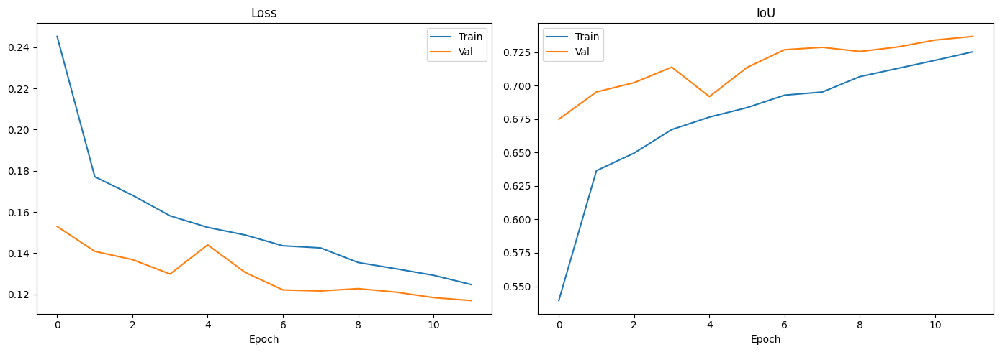

Best Val IoU: 0.7367


In [23]:
# ============================================================
# CELL 13 — Training curves
# ============================================================
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
ax1.plot(history["train_loss"], label="Train"); ax1.plot(history["val_loss"], label="Val")
ax1.set_title("Loss"); ax1.legend(); ax1.set_xlabel("Epoch")
ax2.plot(history["train_iou"],  label="Train"); ax2.plot(history["val_iou"],  label="Val")
ax2.set_title("IoU");  ax2.legend(); ax2.set_xlabel("Epoch")
plt.tight_layout()
plt.savefig("training_curves.png", dpi=150)
plt.show()
print(f"Best Val IoU: {best_val_iou:.4f}")

In [24]:
def get_bboxes_high_recall(proc_pil):

    img  = np.array(proc_pil)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    thresh = cv2.adaptiveThreshold(
        gray, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        blockSize=31,
        C=40   # less aggressive
    )

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    thresh = cv2.dilate(thresh, kernel, iterations=1)

    num_labels, _, stats, _ = cv2.connectedComponentsWithStats(thresh)

    bboxes = []
    for i in range(1, num_labels):
        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]
        area = stats[i, cv2.CC_STAT_AREA]

        if area < 50:   # VERY low threshold
            continue

        bboxes.append([float(x), float(y), float(x+w), float(y+h)])

    return bboxes

✓ Loaded best model from: sam2_best/model.pt
Loaded 7 samples from /kaggle/input/datasets/karimtawfik/hieroglyphics-segmentation-data-sam-2-format/segmentation.v1-2023-03-12-7-33pm.sam2/test  (skipped 0)
Evaluating 7 test images with AUTO-GENERATED bboxes...


Testing:  14%|█▍        | 1/7 [00:02<00:14,  2.37s/it]

  Asmaa-2_jpg.rf.2a9268313f68f1dea822e9441346efce.jpg  IoU: 0.5527  Acc: 0.7972  (234 symbols detected)


Testing:  29%|██▊       | 2/7 [00:04<00:09,  1.95s/it]

  Asmaa-4_jpg.rf.799186fa404b07b5f6fee713014c7db1.jpg  IoU: 0.6000  Acc: 0.8163  (194 symbols detected)


Testing:  43%|████▎     | 3/7 [00:06<00:08,  2.13s/it]

  Asmaa-9_jpg.rf.408be6325c97839a1f38951394cd8218.jpg  IoU: 0.5210  Acc: 0.7727  (281 symbols detected)


Testing:  57%|█████▋    | 4/7 [00:07<00:05,  1.88s/it]

  abyu7_jpg.rf.6701085b6a8c73f654d111b82f5ffa61.jpg  IoU: 0.4795  Acc: 0.7769  (174 symbols detected)


Testing:  71%|███████▏  | 5/7 [00:10<00:04,  2.04s/it]

  et_image-5-_jpg.rf.83985613a7f2f543ed1a8d8eb49b35ce.jpg  IoU: 0.5365  Acc: 0.7255  (267 symbols detected)


Testing:  86%|████████▌ | 6/7 [00:12<00:02,  2.07s/it]

  image6_jpg.rf.32adfb34f44f9b9a837354d01d51dd55.jpg  IoU: 0.2353  Acc: 0.6756  (280 symbols detected)


Testing: 100%|██████████| 7/7 [00:14<00:00,  2.08s/it]

  imageee_jpg.rf.2b9c97bf0ad95cd3061b5f92bc8542ae.jpg  IoU: 0.5301  Acc: 0.7981  (234 symbols detected)

  Test images evaluated : 7
  Mean IoU              : 0.4936
  Mean Pixel Accuracy   : 0.7660


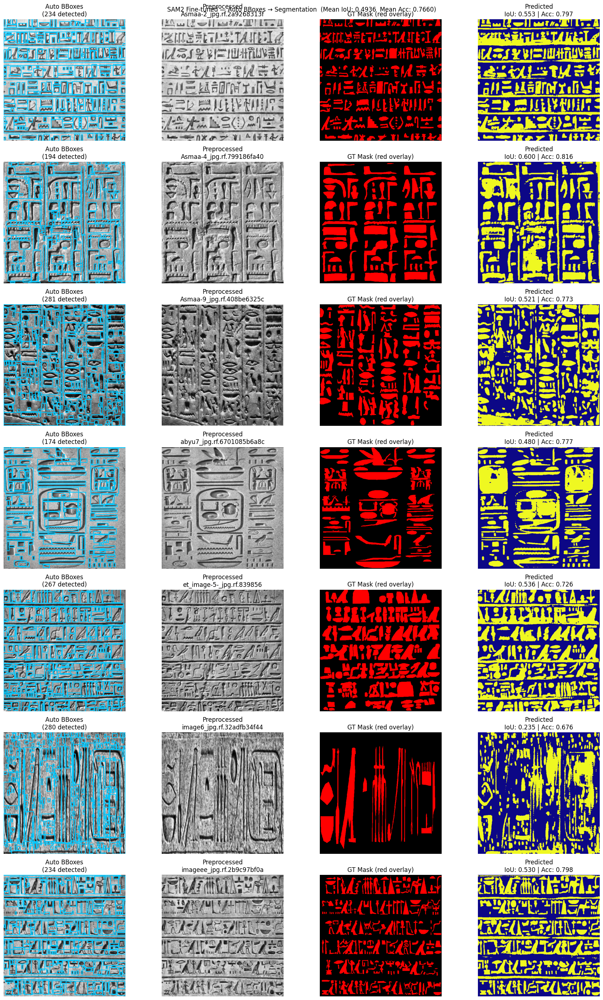

In [25]:
# ============================================================
# CELL 13 — Test evaluation with auto-generated bboxes
# ============================================================
def evaluate_test_auto_bbox(test_dir: str, predictor, n_visualize: int = 7):
    """
    Evaluates fine-tuned SAM2 on test set using auto-generated bboxes.
    GT masks used ONLY for metric computation — no GT labels as prompts.
    """
    # ── load best checkpoint ──
    checkpoint_path = "sam2_best/model.pt"
    if os.path.exists(checkpoint_path):
        predictor.model.load_state_dict(
            torch.load(checkpoint_path, map_location=DEVICE)
        )
        print(f"✓ Loaded best model from: {checkpoint_path}")
    else:
        print("⚠ No checkpoint found — using current weights")

    predictor.model.eval()

    test_samples  = load_dataset(test_dir)
    total_iou     = 0.0
    total_acc     = 0.0
    total_samples = 0
    viz_data      = []

    print(f"Evaluating {len(test_samples)} test images with AUTO-GENERATED bboxes...")

    with torch.no_grad():
        for sample in tqdm(test_samples, desc="Testing"):
            image_np, gt_bboxes, gt_masks = read_sample(sample)
            if image_np is None or len(gt_masks) == 0:
                continue

            # skip corrupted GT
            gt_combined_check = np.maximum.reduce(gt_masks)
            fill_ratio = gt_combined_check.sum() / gt_combined_check.size
            if fill_ratio == 0.0 or fill_ratio > 0.95:
                print(f"  ⚠ Skipping corrupted GT (fill={fill_ratio:.2f})")
                continue

            proc_pil = Image.fromarray(image_np)

            # ── auto-generate bboxes — no GT used ──
            auto_bboxes = get_bboxes_high_recall(proc_pil)
            if not auto_bboxes:
                print(f"  ⚠ No symbols detected — skipping")
                continue

            auto_bboxes_np = np.array(auto_bboxes, dtype=np.float32)
            H, W = image_np.shape[:2]

            # ── encode image once ──
            predictor.set_image(image_np)

            # ── run decoder in chunks ──
            all_preds = []
            for start in range(0, len(auto_bboxes_np), BOX_CHUNK):
                cb = auto_bboxes_np[start:start + BOX_CHUNK]
                with torch.amp.autocast('cuda'):
                    low_res    = sam2_forward(predictor, cb)     # (K, 1, Hl, Wl)
                    pred_chunk = F.interpolate(
                        low_res, size=(H, W),
                        mode='bilinear', align_corners=False
                    )                                            # (K, 1, H, W)
                all_preds.append(pred_chunk.cpu())
                del low_res, pred_chunk
                torch.cuda.empty_cache()

            predictor.reset_predictor()

            pred_masks = torch.cat(all_preds, dim=0)             # (N_auto, 1, H, W)

            # ── combine predicted masks → single binary map ──
            pred_combined = (torch.sigmoid(pred_masks) > 0.5).float()
            pred_combined = pred_combined.squeeze(1).max(dim=0).values  # (H, W)

            # ── combine GT masks → single binary map ──
            gt_combined = torch.tensor(
                np.maximum.reduce(gt_masks).astype(np.float32)
            )                                                     # (H, W)

            iou = compute_iou(
                pred_combined.unsqueeze(0).unsqueeze(0),
                gt_combined.unsqueeze(0).unsqueeze(0)
            )
            acc = ((pred_combined > 0.5) == (gt_combined > 0.5)).float().mean().item()

            if not (0 <= iou <= 1):
                iou = 0.0

            total_iou     += iou
            total_acc     += acc
            total_samples += 1

            fname = os.path.basename(sample['image_path'])
            print(f"  {fname:45s}  IoU: {iou:.4f}  Acc: {acc:.4f}  "
                  f"({len(auto_bboxes)} symbols detected)")

            if len(viz_data) < n_visualize:
                img_boxes = image_np.copy()
                for x1, y1, x2, y2 in auto_bboxes:
                    cv2.rectangle(img_boxes,
                                  (int(x1), int(y1)), (int(x2), int(y2)),
                                  (0, 200, 255), 2)

                gt_np              = gt_combined.numpy()
                gt_display         = np.zeros((*gt_np.shape, 3), dtype=np.uint8)
                gt_display[..., 0] = (gt_np > 0) * 255

                viz_data.append({
                    "img_boxes":     img_boxes,
                    "img_clean":     image_np,
                    "gt_display":    gt_display,
                    "pred_combined": pred_combined.numpy(),
                    "iou":           iou,
                    "acc":           acc,
                    "n_boxes":       len(auto_bboxes),
                    "fname":         fname,
                })

    mean_iou = total_iou / total_samples if total_samples > 0 else 0
    mean_acc = total_acc / total_samples if total_samples > 0 else 0

    print(f"\n{'='*45}")
    print(f"  Test images evaluated : {total_samples}")
    print(f"  Mean IoU              : {mean_iou:.4f}")
    print(f"  Mean Pixel Accuracy   : {mean_acc:.4f}")
    print(f"{'='*45}")

    if not viz_data:
        return

    fig, axes = plt.subplots(len(viz_data), 4,
                             figsize=(18, 4 * len(viz_data)))
    if len(viz_data) == 1:
        axes = [axes]

    for i, d in enumerate(viz_data):
        axes[i][0].imshow(d["img_boxes"])
        axes[i][0].set_title(f"Auto BBoxes\n({d['n_boxes']} detected)")
        axes[i][0].axis("off")

        axes[i][1].imshow(d["img_clean"])
        axes[i][1].set_title(f"Preprocessed\n{d['fname'][:25]}")
        axes[i][1].axis("off")

        axes[i][2].imshow(d["gt_display"])
        axes[i][2].set_title("GT Mask (red overlay)")
        axes[i][2].axis("off")

        axes[i][3].imshow(d["pred_combined"], cmap="plasma", vmin=0, vmax=1)
        axes[i][3].set_title(f"Predicted\nIoU: {d['iou']:.3f} | Acc: {d['acc']:.3f}")
        axes[i][3].axis("off")

    plt.suptitle(f"SAM2 Fine-tuned — Auto BBoxes → Segmentation  "
                 f"(Mean IoU: {mean_iou:.4f}  Mean Acc: {mean_acc:.4f})",
                 fontsize=12)
    plt.tight_layout()
    plt.show()


# ── run after training ──
evaluate_test_auto_bbox(TEST_DIR, predictor, n_visualize=7)

✓ Loaded best model from: sam2_best/model.pt
Loaded 7 samples from /kaggle/input/datasets/karimtawfik/hieroglyphics-segmentation-data-sam-2-format/segmentation.v1-2023-03-12-7-33pm.sam2/test  (skipped 0)
Evaluating 7 test images with GT bboxes...


Testing:  14%|█▍        | 1/7 [00:02<00:13,  2.17s/it]

Asmaa-2_jpg.rf.2a9268313f68f1dea822e9441346efce.jpg  IoU: 0.7860  Acc: 0.9307  (211 GT boxes)


Testing:  29%|██▊       | 2/7 [00:03<00:06,  1.40s/it]

Asmaa-4_jpg.rf.799186fa404b07b5f6fee713014c7db1.jpg  IoU: 0.7502  Acc: 0.8994  (72 GT boxes)


Testing:  43%|████▎     | 3/7 [00:04<00:05,  1.30s/it]

Asmaa-9_jpg.rf.408be6325c97839a1f38951394cd8218.jpg  IoU: 0.7761  Acc: 0.9168  (111 GT boxes)


Testing:  57%|█████▋    | 4/7 [00:04<00:03,  1.09s/it]

abyu7_jpg.rf.6701085b6a8c73f654d111b82f5ffa61.jpg  IoU: 0.7734  Acc: 0.9278  (67 GT boxes)


Testing:  71%|███████▏  | 5/7 [00:06<00:02,  1.24s/it]

et_image-5-_jpg.rf.83985613a7f2f543ed1a8d8eb49b35ce.jpg  IoU: 0.7808  Acc: 0.9029  (146 GT boxes)


Testing:  86%|████████▌ | 6/7 [00:06<00:00,  1.08it/s]

image6_jpg.rf.32adfb34f44f9b9a837354d01d51dd55.jpg  IoU: 0.3829  Acc: 0.8510  (15 GT boxes)


Testing: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it]

imageee_jpg.rf.2b9c97bf0ad95cd3061b5f92bc8542ae.jpg  IoU: 0.7319  Acc: 0.9129  (195 GT boxes)

  Test images evaluated : 7
  Mean IoU              : 0.7116
  Mean Pixel Accuracy   : 0.9059


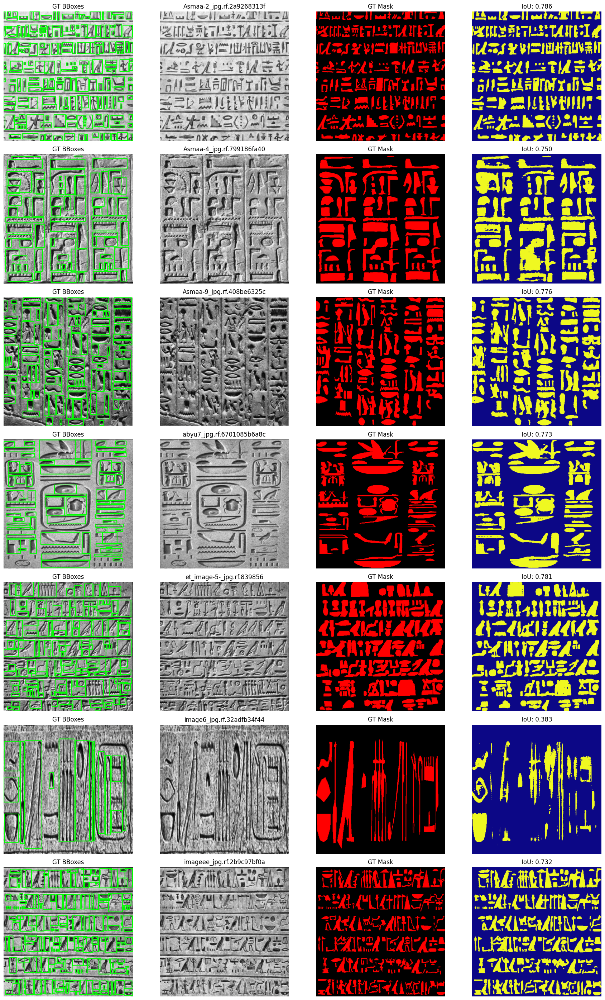

In [26]:
# ============================================================
# CELL 13 — Test evaluation with GT bboxes (CLEAN EVAL)
# ============================================================

def evaluate_test_gt_bbox(test_dir: str, predictor, n_visualize: int = 7):

    checkpoint_path = "sam2_best/model.pt"
    if os.path.exists(checkpoint_path):
        predictor.model.load_state_dict(
            torch.load(checkpoint_path, map_location=DEVICE)
        )
        print(f"✓ Loaded best model from: {checkpoint_path}")
    else:
        print("⚠ No checkpoint found — using current weights")

    predictor.model.eval()

    test_samples  = load_dataset(test_dir)
    total_iou     = 0.0
    total_acc     = 0.0
    total_samples = 0
    viz_data      = []

    print(f"Evaluating {len(test_samples)} test images with GT bboxes...")

    with torch.no_grad():
        for sample in tqdm(test_samples, desc="Testing"):

            image_np, bboxes, masks = read_sample(sample)
            if image_np is None or len(bboxes) == 0:
                continue

            H, W     = image_np.shape[:2]
            N        = len(bboxes)

            gt_np    = np.stack(masks, axis=0).astype(np.float32)
            boxes_np = np.array(bboxes, dtype=np.float32)

            predictor.set_image(image_np)

            all_preds = []

            for i in range(0, N, BOX_CHUNK):
                cb  = boxes_np[i:i+BOX_CHUNK]

                with torch.amp.autocast('cuda'):
                    low_res = sam2_forward(predictor, cb)

                    pred = F.interpolate(
                        low_res, size=(H, W),
                        mode='bilinear', align_corners=False
                    )

                all_preds.append(pred.cpu())

                del low_res, pred
                torch.cuda.empty_cache()

            predictor.reset_predictor()

            pred_masks = torch.cat(all_preds, dim=0)  # (N,1,H,W)

            # ── combine predictions ──
            pred_combined = (torch.sigmoid(pred_masks) > 0.5).float()
            pred_combined = pred_combined.squeeze(1).max(dim=0).values

            # ── combine GT ──
            gt_combined = torch.tensor(
                np.maximum.reduce(gt_np).astype(np.float32)
            )

            iou = compute_iou(
                pred_combined.unsqueeze(0).unsqueeze(0),
                gt_combined.unsqueeze(0).unsqueeze(0)
            )

            acc = ((pred_combined > 0.5) == (gt_combined > 0.5)).float().mean().item()

            total_iou     += iou
            total_acc     += acc
            total_samples += 1

            fname = os.path.basename(sample['image_path'])
            print(f"{fname:45s}  IoU: {iou:.4f}  Acc: {acc:.4f}  ({N} GT boxes)")

            # ── visualization ──
            if len(viz_data) < n_visualize:

                img_boxes = image_np.copy()
                for x1, y1, x2, y2 in bboxes:
                    cv2.rectangle(img_boxes,
                                  (int(x1), int(y1)),
                                  (int(x2), int(y2)),
                                  (0, 255, 0), 2)

                gt_np_vis = gt_combined.numpy()
                gt_display = np.zeros((*gt_np_vis.shape, 3), dtype=np.uint8)
                gt_display[..., 0] = (gt_np_vis > 0) * 255

                viz_data.append({
                    "img_boxes": img_boxes,
                    "img_clean": image_np,
                    "gt": gt_display,
                    "pred": pred_combined.numpy(),
                    "iou": iou,
                    "acc": acc,
                    "fname": fname
                })

    mean_iou = total_iou / max(total_samples, 1)
    mean_acc = total_acc / max(total_samples, 1)

    print("\n=============================================")
    print(f"  Test images evaluated : {total_samples}")
    print(f"  Mean IoU              : {mean_iou:.4f}")
    print(f"  Mean Pixel Accuracy   : {mean_acc:.4f}")
    print("=============================================")

    # ── VISUALIZE ──
    if not viz_data:
        return

    fig, axes = plt.subplots(len(viz_data), 4,
                             figsize=(18, 4 * len(viz_data)))

    if len(viz_data) == 1:
        axes = [axes]

    for i, d in enumerate(viz_data):

        axes[i][0].imshow(d["img_boxes"])
        axes[i][0].set_title("GT BBoxes")
        axes[i][0].axis("off")

        axes[i][1].imshow(d["img_clean"])
        axes[i][1].set_title(d["fname"][:25])
        axes[i][1].axis("off")

        axes[i][2].imshow(d["gt"])
        axes[i][2].set_title("GT Mask")
        axes[i][2].axis("off")

        axes[i][3].imshow(d["pred"], cmap="plasma", vmin=0, vmax=1)
        axes[i][3].set_title(f"IoU: {d['iou']:.3f}")
        axes[i][3].axis("off")

    plt.tight_layout()
    plt.show()


# ── RUN ──
evaluate_test_gt_bbox(TEST_DIR, predictor, n_visualize=7)

In [27]:
# ============================================================
# CELL 15 — Save Fine-tuned Model (.pth)
# ============================================================
save_path = "sam2_hieroglyphcs.pth"

# Strategy: Save the state_dict of the entire model.
# Since we frozen the image encoder, those weights remain the same, 
# but the decoder and prompt encoder will have your new hieroglyph knowledge.

save_dict = {
    'epoch': epoch,
    'model_state_dict': predictor.model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'history': history,
    'iou': best_val_iou
}

torch.save(save_dict, save_path)

print(f"✅ Model saved to: {save_path}")
print(f"📦 File size: {os.path.getsize(save_path) / 1024**2:.2f} MB")

✅ Model saved to: sam2_hieroglyphcs.pth
📦 File size: 178.87 MB


In [28]:
# ============================================================
# CELL 17 — Calculate Final Test IoU (with Bboxes)
# ============================================================
def evaluate_test_set(data_dir):
    predictor.model.load_state_dict(torch.load("sam2_best/model.pt", map_location=DEVICE))
    predictor.model.eval()
    
    test_samples = load_dataset(data_dir)
    total_iou = 0
    count = 0

    print(f"Evaluating {len(test_samples)} images...")
    with torch.no_grad():
        for sample in tqdm(test_samples):
            image_np, bboxes, masks = read_sample(sample)
            if image_np is None or len(bboxes) == 0:
                continue

            H, W = image_np.shape[:2]
            predictor.set_image(image_np)
            
            # Process all boxes for this image
            boxes_np = np.array(bboxes, dtype=np.float32)
            gt_np = np.stack(masks, axis=0).astype(np.float32)
            
            sample_iou = 0
            num_chunks = math.ceil(len(bboxes) / BOX_CHUNK)
            
            for i in range(0, len(bboxes), BOX_CHUNK):
                cb = boxes_np[i:i+BOX_CHUNK]
                cgt = torch.tensor(gt_np[i:i+BOX_CHUNK], device=DEVICE).unsqueeze(1)
                
                low_res = sam2_forward(predictor, cb)
                pred = F.interpolate(low_res, size=(H, W), mode='bilinear', align_corners=False)
                
                sample_iou += compute_iou(pred, cgt)
            
            total_iou += (sample_iou / num_chunks)
            count += 1
            predictor.reset_predictor()

    final_test_iou = total_iou / count if count > 0 else 0
    print(f"\n========================================")
    print(f"FINAL TEST IoU: {final_test_iou:.4f}")
    print(f"========================================")

evaluate_test_set(TEST_DIR)

Loaded 7 samples from /kaggle/input/datasets/karimtawfik/hieroglyphics-segmentation-data-sam-2-format/segmentation.v1-2023-03-12-7-33pm.sam2/test  (skipped 0)
Evaluating 7 images...


100%|██████████| 7/7 [00:06<00:00,  1.04it/s]


FINAL TEST IoU: 0.7182
